# 1. Delta

$$ Δ = \frac{∂V}{∂S} $$

- 현물 가격 변화에 따른 옵션 가치 변화
- 만기 시점에 옵션이 행사될 수 있는 확률과 같음

In [88]:
import numpy as np
import scipy.stats as stat
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=False)

In [89]:
def delta(option_type, S, K, r, T, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * (sigma ** 2)) * T) / (sigma * np.sqrt(T))
    
    if option_type == 1:
        return stat.norm.cdf(d1)
    else:
        return stat.norm.cdf(d1) - 1

In [90]:
call = 1
put = -1

K = 100
r = 0.01
sigma = 0.25

n1 = 100
n2 = 50 # iplot 등고선 50개 그린다는 말
start_t = 0.000001 # 0으로 하면 ZeroDivide Error 떠서
end_t = 1
start_s = 0.000001
end_s = 200

T = np.linspace(start_t, end_t, n1)
S = np.linspace(start_s, end_s, n1)
T, S = np.meshgrid(T, S)

call_delta = delta(call, S, K, r, T, sigma)
put_delta = delta(put, S, K, r, T, sigma)

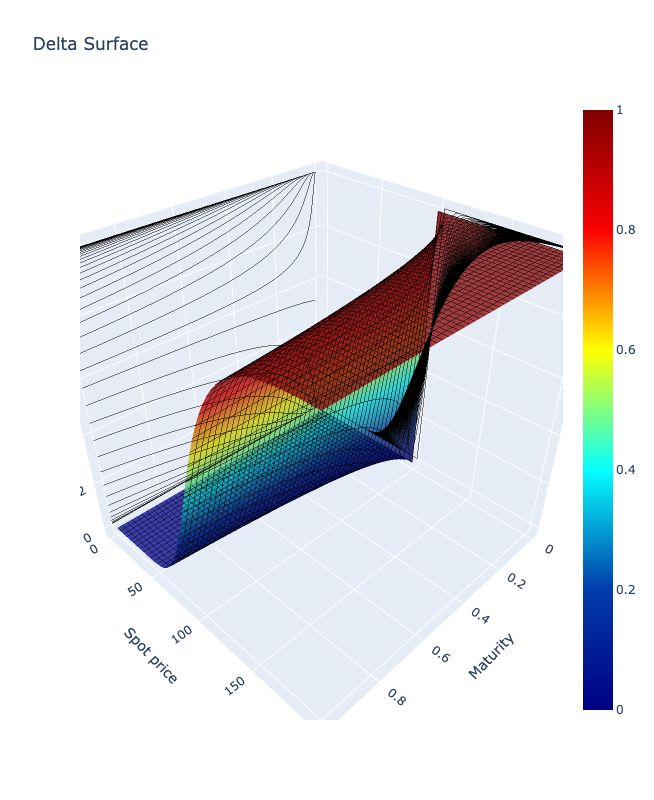

In [91]:
trace = go.Surface(x=T, y=S, z=call_delta, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t - start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s - start_s)/n2, project_y=True))
data = [trace]
layout = go.Layout(title='Delta Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Delta'}},
                  width=800, height=800)
fig = go.Figure(data=data, layout=layout)
iplot(fig)


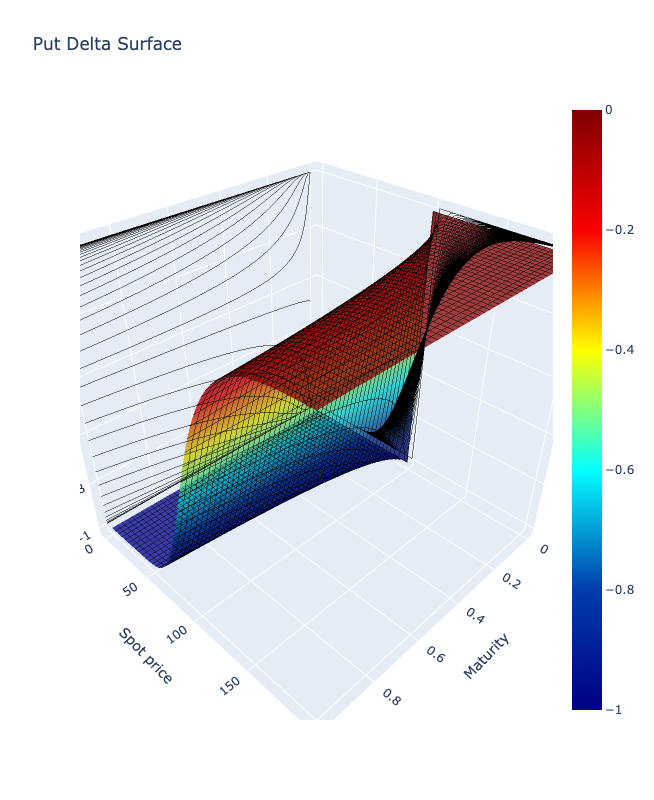

In [92]:
# Put option

trace = go.Surface(x=T, y=S, z=put_delta, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t - start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s - start_s)/n2, project_y=True))
data = [trace]
layout = go.Layout(title='Put Delta Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Delta'}},
                  width=800, height=800)
fig = go.Figure(data=data, layout=layout)
iplot(fig)

# 2. Theta

$$ Θ = \frac{∂V}{∂t} $$

- 시간 단위당 옵션 가치 변화

In [93]:
def theta(option_type, S, K, r, T, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * (sigma ** 2)) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * T ** 0.5
    return (-sigma * S * stat.norm.pdf(d1)) / (2 * np.sqrt(T)) - option_type * (r * K * np.exp(-r * T) * stat.norm.cdf(option_type * d2))


In [94]:
call = 1
put = -1

K = 100 # 행사 가격
r = 0.01
sigma = 0.25

n1 = 100
n2 = 50
start_t = 0.000001
end_t = 1 # 만기 0 ~ 1
start_s = 0.000001
end_s = 200 # 만기 가격 0 ~ 200

T = np.linspace(start_t, end_t, n1)
S = np.linspace(start_s, end_s, n1)
T, S = np.meshgrid(T, S)

call_theta = theta(call, S, K, r, T, sigma)
put_theta = theta(put, S, K, r, T, sigma)

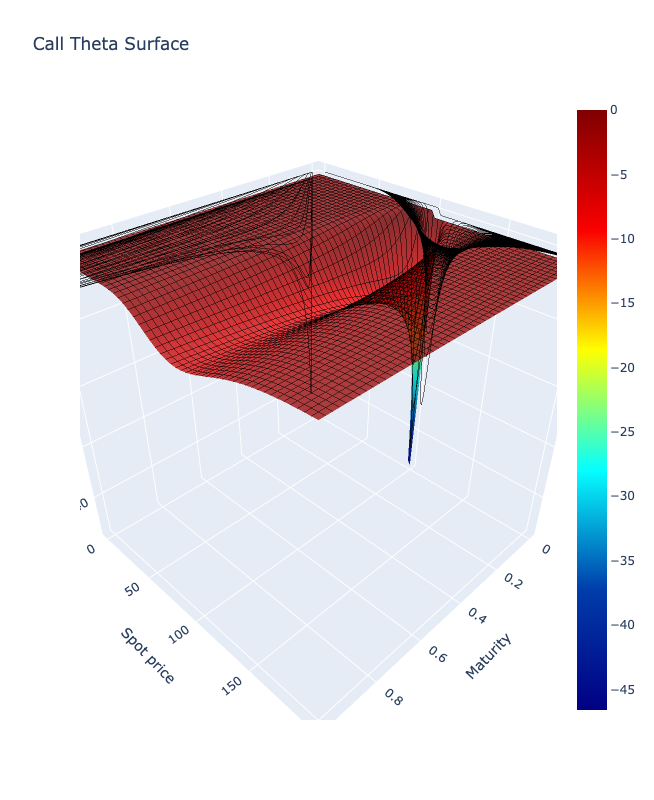

In [95]:
trace = go.Surface(x=T, y=S, z=call_theta, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))

data = [trace]
layout = go.Layout(title='Call Theta Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Theta'}},
                  width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

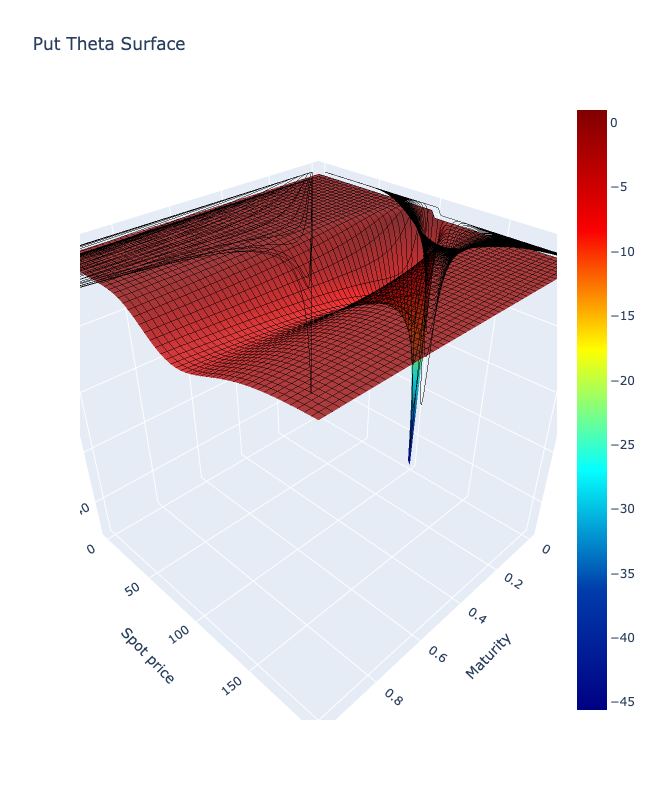

In [96]:
trace = go.Surface(x=T, y=S, z=put_theta, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))

data=[trace]
layout = go.Layout(title='Put Theta Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Theta'}},
                  width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

### 유러피안 옵션에서

- 만기가 짧아질수록 세타에 대한 민감도는 증가 / 당연히 만기가 얼마 안남았으면 행사하느냐 마느냐 중요해지니까
- ITM/OTM 에서는 세타의 영향이 비교적 줄어듦 / 어차피 먹거나 못먹거나 거의 확실해졌으므로

- 풋옵션에서 특이한 점은, ITM에서는 세타가 양수로 나타남. 즉, 시간이 갈수록 유리한 포지션이라는 말. 왜냐하면 풋옵션은 하방이 제한되어 있기 때문에 내가격(떡락)인 상태에서는 상승 방향이 유리하므로 행사 기간이 멀면 더 불리함.

# 3. Gamma

$$ Γ = \frac{∂^2V}{∂S^2} $$

- 기초자산 가격변화에 따른 델타 변화량
- 감마가 크면 델타헷지 주기를 짧게 가져가야함 / 귀찮다는말

In [97]:
def gamma(option_type, S, K, r, T, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * (sigma ** 2)) * T) / (sigma * np.sqrt(T))
    return stat.norm.pdf(d1) / (S * sigma * np.sqrt(T))

In [98]:
call = 1
put = -1

K = 100
r = 0.01
sigma = 0.25

n1 = 100
n2 = 50
start_t = 0.000001
end_t = 1
start_s = 0.000001
end_s = 200

T = np.linspace(start_t, end_t, n1)
S = np.linspace(start_s, end_s, n1)
T, S = np.meshgrid(T, S)

call_gamma = gamma(call, S, K, r, T, sigma)
put_gamma = gamma(put, S, K, r, T, sigma)

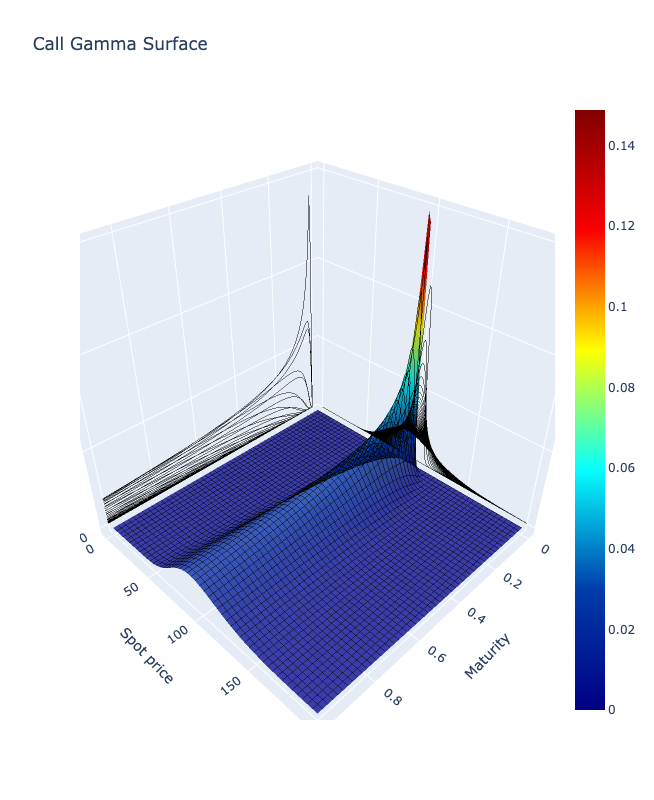

In [99]:
trace = go.Surface(x=T, y=S, z=call_gamma, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))
data = [trace]

layout = go.Layout(title='Call Gamma Surface',
               scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Gamma'}},
                  width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

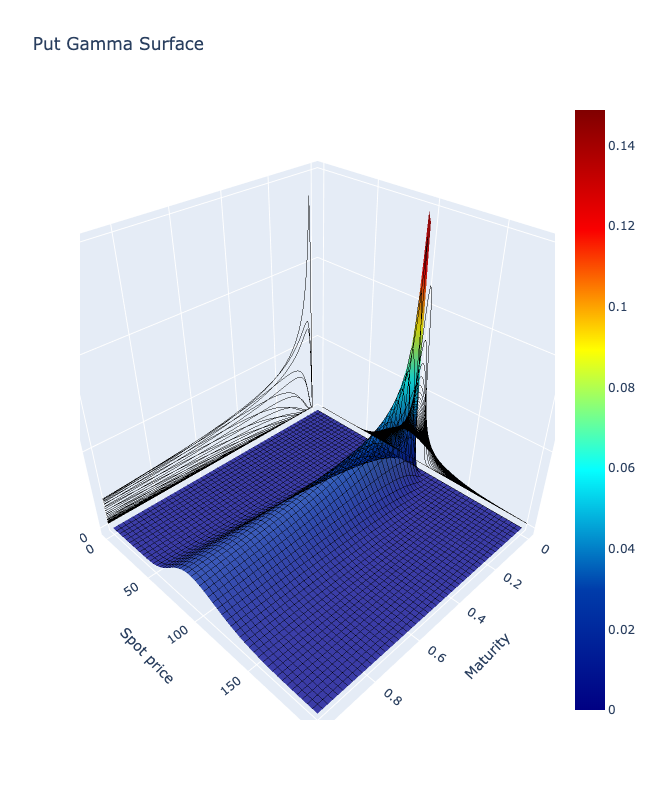

In [100]:
trace = go.Surface(x=T, y=S, z=put_gamma, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))
data = [trace]

layout = go.Layout(title='Put Gamma Surface',
               scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Gamma'}},
                  width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

- 만기가 다가올수록 감마는 급격하게 증가
- 세타와 반대부호를 나타냄 / 세타 long -> 감마 short

- 결론적으로 long 감마는 실현 변동성에 배팅하는 것

In [101]:
import pandas as pd

df = pd.DataFrame({'Gamma': ['+', '-'], 'Theta': ['-', '+']})
df.index = ['Option long', 'Option short']
df

,Gamma,Theta
Option long,+,-
Option short,-,+


# 4. Vega

$$ v = \frac{∂V}{∂σ} $$

- 변동성 한 단위 당 옵션 가치 변화량

In [102]:
def vega(option_type, S, K, r, T, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * (sigma ** 2)) * T) / (sigma * np.sqrt(T))
    return S * np.sqrt(T) * stat.norm.pdf(d1)

In [103]:
call = 1
put = -1

K = 100
r = 0.01
sigma = 0.25

n1 = 100
n2 = 50
start_t = 0.000001
end_t = 1
start_s = 0.000001
end_s = 200

T = np.linspace(start_t, end_t, n1)
S = np.linspace(start_s, end_s, n1)
T, S = np.meshgrid(T, S)

call_vega = vega(call, S, K, r, T, sigma)
put_vega = vega(put, S, K, r, T, sigma)

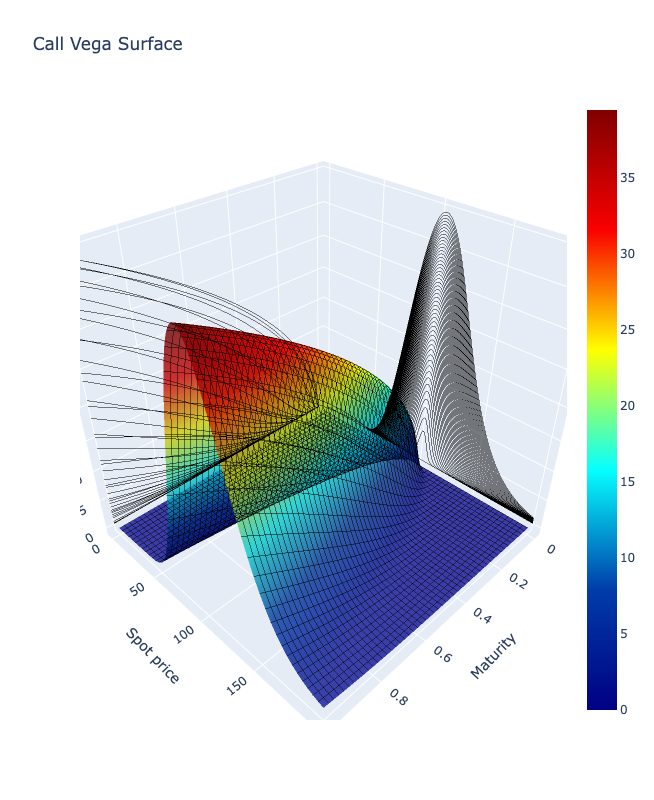

In [104]:
trace = go.Surface(x=T, y=S, z=call_vega, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))
data = [trace]
layout = go.Layout(title='Call Vega Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Vega'}},
                   width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

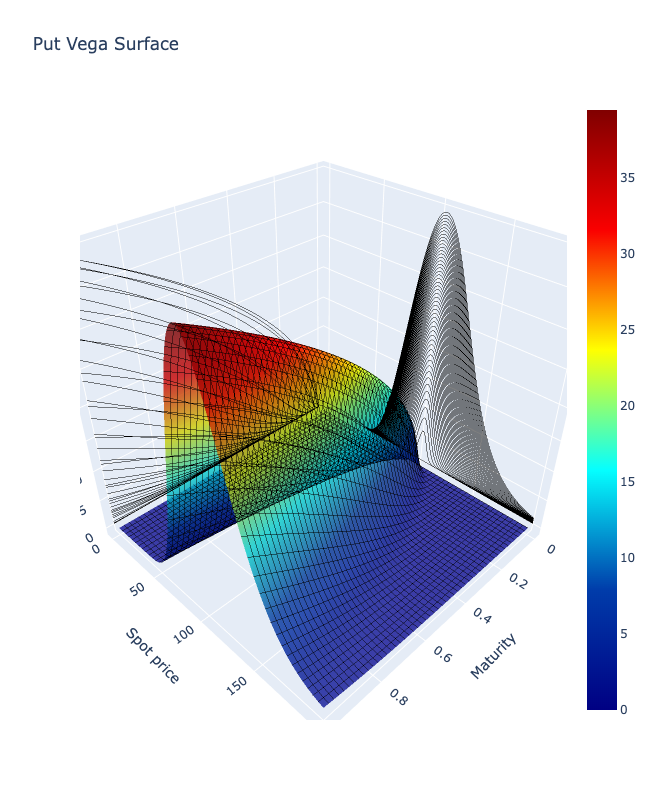

In [105]:
trace = go.Surface(x=T, y=S, z=put_vega, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))
data = [trace]
layout = go.Layout(title='Put Vega Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Vega'}},
                   width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

- ATM에서 베가가 가장 높음
- 만기가 가까워질수록 베가는 감소 / 감마와 반대 => 시간이 흐를수록 감마의 영향력이 커짐
- 0 부근 베가가 더 작은 이유는 방향이 한쪽밖에 안열려있기 때문 / 상방에서는 양옆으로 변동 가능성이 있지만 하방에서는 단방향

# 5. Rho

$$ ρ = \frac{∂V}{∂r} $$

- 이자율 한 단위 당 옵션 가치 변화량

In [106]:
def rho(option_type, S, K, r, T, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * (sigma ** 2)) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    return option_type * K * T * np.exp(-r * T) * stat.norm.cdf(option_type * d2)

In [107]:
call = 1
put = -1

K = 100
r = 0.01
sigma = 0.05

n1 = 100
n2 = 50
start_t = 0.000001
end_t = 1
start_s = 0.000001
end_s = 200

T = np.linspace(start_t, end_t, n1)
S = np.linspace(start_s, end_s, n1)
T, S = np.meshgrid(T, S)

call_rho = rho(call, S, K, r, T, sigma)
put_rho = rho(put, S, K, r, T, sigma)

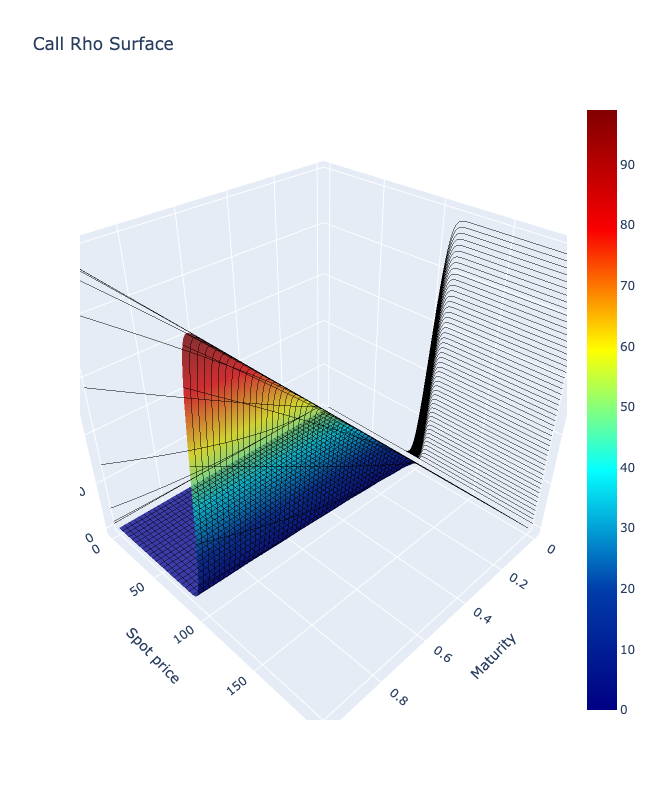

In [109]:
trace = go.Surface(x=T, y=S, z=call_rho, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, color='black', start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, color='black', start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))
data = [trace]
layout = go.Layout(title='Call Rho Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Rho'}},
                  width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)
iplot(fig)


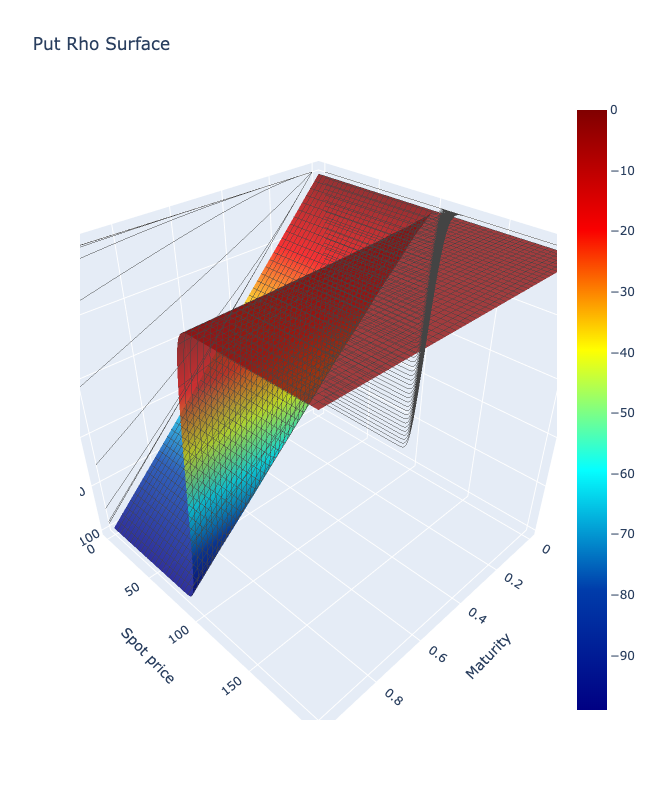

In [110]:
trace = go.Surface(x=T, y=S, z=put_rho, colorscale='Jet', opacity=0.8,
                  contours_x=dict(show=True, start=start_t, end=end_t, size=(end_t-start_t)/n2, project_x=True),
                  contours_y=dict(show=True, start=start_s, end=end_s, size=(end_s-start_s)/n2, project_y=True))
data = [trace]
layout = go.Layout(title='Put Rho Surface',
                  scene={'xaxis': {'title': 'Maturity'}, 'yaxis': {'title': 'Spot price'}, 'zaxis': {'title': 'Rho'}},
                  width=800, height=800, margin=dict(pad=0))
fig = go.Figure(data=data, layout=layout)

iplot(fig)

- OTM에서는 거의 영향 없음
- 만기가 짧아질수록 영향 줄어듦
- 대금 지출 시점이 늦어지는 콜옵션은 이자율이 높을수록 유리

In [113]:
df = pd.DataFrame({'Delta': ['+', '-'], 'Theta': ['-', '-'], 'Gamma': ['+', '+'],
                  'Vega': ['+', '+'], 'Rho': ['+', '-']})
df.index = ['Long Call', 'Long Put']
df

,Delta,Theta,Gamma,Vega,Rho
Long Call,+,-,+,+,+
Long Put,-,-,+,+,-
